#Visium CytAssist Spatial Analysis
### Reproducing Figure 2b and Figure 2c from Janesick et al. (2023)
**Paper:** High resolution mapping of the tumor microenvironment using integrated single-cell, spatial and in situ analysis  
**Goal:** Load the processed Visium data, apply the official cell type annotations, and reproduce the spatial cluster and gene expression maps from the paper.

---
## Files Needed in Google Drive
Upload these **four files** (keeping their original names) into a single folder in Google Drive, for example a folder called `visium_data`:

| File | What it is |
|------|------------|
| `CytAssist_FFPE_Human_Breast_Cancer_filtered_feature_bc_matrix.h5` | Main expression matrix |
| `CytAssist_FFPE_Human_Breast_Cancer_spatial_tar.gz` | Tissue image + spot coordinates |
| `CytAssist_FFPE_Human_Breast_Cancer_analysis_tar.gz` | Pre-computed clustering |
| `Cell_Barcode_Type_Matrices.xlsx` | Official cell type annotations from 10x |

---

## Step 1 — Install Required Libraries
Run this first. Takes 2-3 minutes. Only needs to run once per Colab session.

In [38]:
!pip install -q scanpy squidpy matplotlib seaborn pandas numpy openpyxl
print("Installation complete.")

Installation complete.


## Step 2 — Import Libraries

In [39]:
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import scipy.sparse as sp
import tarfile
import os
import warnings
warnings.filterwarnings('ignore')

sc.set_figure_params(dpi=100, facecolor='white', figsize=(8, 8))
sc.settings.verbosity = 1

print(f"scanpy  : {sc.__version__}")
print(f"squidpy : {sq.__version__}")
print(f"pandas  : {pd.__version__}")
print(f"numpy   : {np.__version__}")

scanpy  : 1.12.1
squidpy : 1.8.1
pandas  : 2.3.3
numpy   : 2.0.2


## Step 3 — Mount Google Drive

In [40]:
from google.colab import drive
drive.mount('/content/drive')
print("Google Drive mounted.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive mounted.


## Step 4 — Set Your Folder Path
**This is the only thing you need to change.**  
Set `DRIVE_FOLDER` to the name of the folder in Google Drive where you uploaded the files.  
For example if your files are in `MyDrive/visium_data/` then write `visium_data`.

In [41]:
# ============================================================
# CHANGE THIS LINE ONLY
DRIVE_FOLDER = 'visium_data'
# ============================================================

BASE_PATH = f'/content/drive/MyDrive/{DRIVE_FOLDER}'

# CORRECTED filenames — dots not underscores before tar.gz
H5_FILE         = 'CytAssist_FFPE_Human_Breast_Cancer_filtered_feature_bc_matrix.h5'
SPATIAL_TAR     = 'CytAssist_FFPE_Human_Breast_Cancer_spatial.tar.gz'
ANALYSIS_TAR    = 'CytAssist_FFPE_Human_Breast_Cancer_analysis.tar.gz'
ANNOTATION_FILE = 'Cell_Barcode_Type_Matrices.xlsx'

# Check all files exist
all_good = True
for fname in [H5_FILE, SPATIAL_TAR, ANALYSIS_TAR, ANNOTATION_FILE]:
    fpath = os.path.join(BASE_PATH, fname)
    if os.path.exists(fpath):
        size_mb = os.path.getsize(fpath) / 1e6
        print(f"  FOUND ({size_mb:.1f} MB): {fname}")
    else:
        print(f"  MISSING: {fname}")
        print(f"           Expected at: {fpath}")
        all_good = False

if all_good:
    print("\nAll files found. Ready to proceed.")
else:
    print("\nSome files are missing. Check your folder name and re-upload if needed.")

  FOUND (33.3 MB): CytAssist_FFPE_Human_Breast_Cancer_filtered_feature_bc_matrix.h5
  FOUND (34.5 MB): CytAssist_FFPE_Human_Breast_Cancer_spatial.tar.gz
  FOUND (37.6 MB): CytAssist_FFPE_Human_Breast_Cancer_analysis.tar.gz
  FOUND (9.4 MB): Cell_Barcode_Type_Matrices.xlsx

All files found. Ready to proceed.


In [42]:
# DIAGNOSTIC — run this to see exactly what files Colab can see
import os

BASE_PATH = f'/content/drive/MyDrive/{DRIVE_FOLDER}'

print(f"Looking in: {BASE_PATH}")
print()

if os.path.exists(BASE_PATH):
    print("Folder EXISTS. Files inside:")
    for f in sorted(os.listdir(BASE_PATH)):
        size = os.path.getsize(os.path.join(BASE_PATH, f)) / 1e6
        print(f"  ({size:.1f} MB)  {f}")
else:
    print("FOLDER DOES NOT EXIST.")
    print("Your DRIVE_FOLDER name is wrong.")
    print()
    print("Folders available in MyDrive:")
    for f in sorted(os.listdir('/content/drive/MyDrive')):
        print(f"  {f}")

Looking in: /content/drive/MyDrive/visium_data

Folder EXISTS. Files inside:
  (9.4 MB)  Cell_Barcode_Type_Matrices.xlsx
  (37.6 MB)  CytAssist_FFPE_Human_Breast_Cancer_analysis.tar.gz
  (33.3 MB)  CytAssist_FFPE_Human_Breast_Cancer_filtered_feature_bc_matrix.h5
  (34.5 MB)  CytAssist_FFPE_Human_Breast_Cancer_spatial.tar.gz
  (0.0 MB)  analysis
  (0.0 MB)  spatial
  (763.9 MB)  visium_processed_annotated.h5ad


## Step 5 — Unzip the Spatial and Analysis Files
This extracts the spatial folder (tissue image, spot coordinates) and the pre-computed analysis files.

In [43]:
# Unzip spatial tar
spatial_tar_path  = os.path.join(BASE_PATH, SPATIAL_TAR)
analysis_tar_path = os.path.join(BASE_PATH, ANALYSIS_TAR)

print("Extracting spatial files...")
with tarfile.open(spatial_tar_path, 'r:gz') as tar:
    tar.extractall(path=BASE_PATH)
print("  Done.")

print("Extracting analysis files...")
with tarfile.open(analysis_tar_path, 'r:gz') as tar:
    tar.extractall(path=BASE_PATH)
print("  Done.")

# Confirm spatial folder contents
spatial_dir = os.path.join(BASE_PATH, 'spatial')
print("\nFiles in spatial/ folder:")
for f in sorted(os.listdir(spatial_dir)):
    print(f"  {f}")

# Confirm analysis folder contents
analysis_dir = os.path.join(BASE_PATH, 'analysis')
print("\nFolders in analysis/:")
for f in sorted(os.listdir(analysis_dir)):
    print(f"  {f}")

Extracting spatial files...
  Done.
Extracting analysis files...
  Done.

Files in spatial/ folder:
  aligned_fiducials.jpg
  aligned_tissue_image.jpg
  cytassist_image.tiff
  detected_tissue_image.jpg
  scalefactors_json.json
  spatial_enrichment.csv
  tissue_hires_image.png
  tissue_lowres_image.png
  tissue_positions.csv

Folders in analysis/:
  clustering
  diffexp
  pca
  tsne
  umap


## Step 6 — Load the Visium Data
Loads the expression matrix together with the tissue image and spot coordinates.

In [44]:
adata = sc.read_visium(
    path=BASE_PATH,
    count_file=H5_FILE,
    load_images=True
)

adata.var_names_make_unique()

print("Data loaded successfully.")
print(f"Spots : {adata.n_obs}   (paper reports 4,992)")
print(f"Genes : {adata.n_vars}")
print(adata)

Data loaded successfully.
Spots : 4992   (paper reports 4,992)
Genes : 18085
AnnData object with n_obs × n_vars = 4992 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'


## Step 7 — Quick Sanity Check: View the Tissue
If you see the H&E image with coloured spots on top, everything loaded correctly.

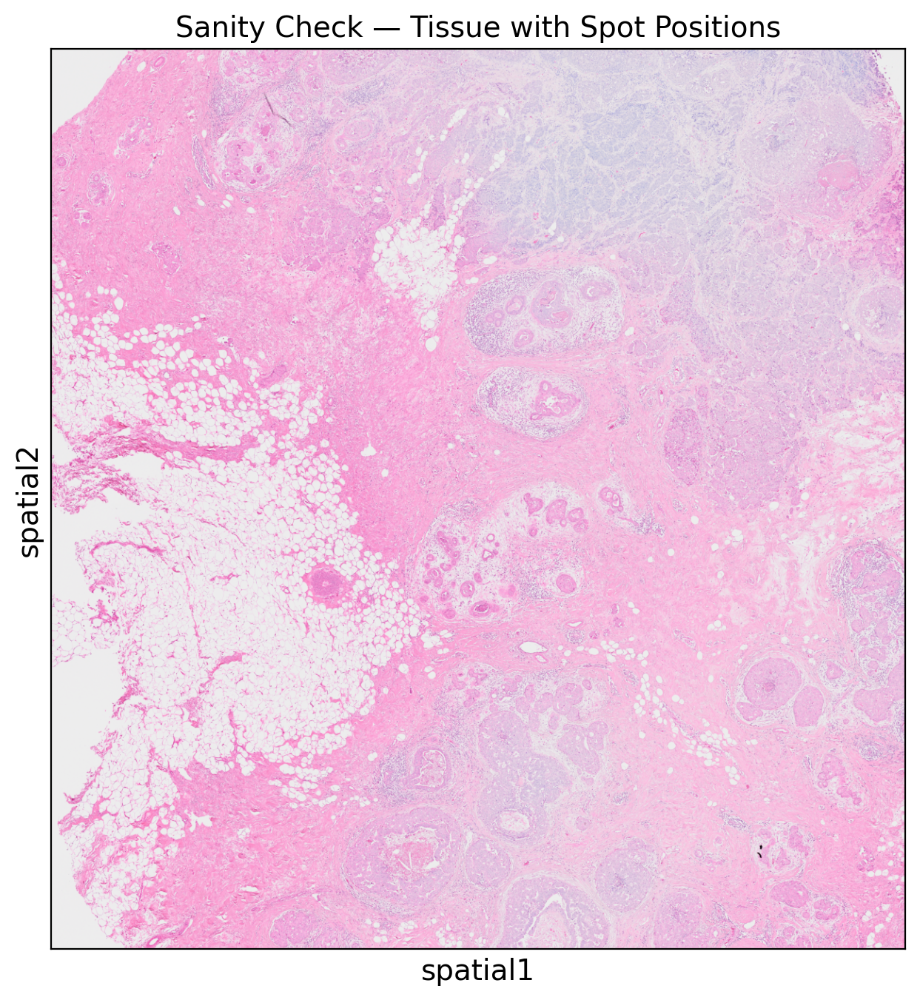

In [45]:
sc.pl.spatial(
    adata,
    img_key='hires',
    color=None,
    title='Sanity Check — Tissue with Spot Positions',
    show=True
)

## Step 8 — Load Official Cell Type Annotations
The Excel file contains the exact annotations used in the paper for each spot barcode.
The Visium sheet has three columns: Barcode, Cluster (number), Annotation (cell type name).

In [46]:
annotation_path = os.path.join(BASE_PATH, ANNOTATION_FILE)

# Load the Visium sheet specifically
vis_annot = pd.read_excel(annotation_path, sheet_name='Visium')

print(f"Annotation table loaded: {vis_annot.shape[0]} rows")
print(f"Columns: {vis_annot.columns.tolist()}")
print()
print("First 5 rows:")
print(vis_annot.head())
print()
print("Unique cell type annotations in the paper:")
for annot in sorted(vis_annot['Annotation'].unique()):
    count = (vis_annot['Annotation'] == annot).sum()
    print(f"  {annot:40s} {count} spots")

Annotation table loaded: 4992 rows
Columns: ['Barcode', 'Cluster', 'Annotation']

First 5 rows:
              Barcode  Cluster                  Annotation
0  AACACCTACTATCGAA-1        1         stromal/endothelial
1  AACACGTGCATCGCAC-1        5         stromal/endothelial
2  AACACTTGGCAAGGAA-1       12                       mixed
3  AACAGGAAGAGCATAG-1        2  stromal/endothelial/immune
4  AACAGGATTCATAGTT-1        5         stromal/endothelial

Unique cell type annotations in the paper:
  DCIS #1                                  344 spots
  DCIS #2                                  210 spots
  adipocytes                               505 spots
  immune                                   263 spots
  invasive                                 599 spots
  mixed                                    438 spots
  mixed/invasive                           369 spots
  myoepithelial/stromal/immune             110 spots
  stromal                                  555 spots
  stromal/endothelial        

In [47]:
# Set Barcode as index to match AnnData barcodes
vis_annot = vis_annot.set_index('Barcode')

# Add cluster number and annotation to AnnData
adata.obs['cluster_number'] = adata.obs_names.map(
    vis_annot['Cluster']
).astype('category')

adata.obs['cell_type'] = adata.obs_names.map(
    vis_annot['Annotation']
).fillna('unmatched')

# Check how many spots were matched
matched   = (adata.obs['cell_type'] != 'unmatched').sum()
unmatched = (adata.obs['cell_type'] == 'unmatched').sum()
print(f"Spots successfully annotated : {matched}")
print(f"Spots not matched            : {unmatched}")
print()
print("Cell type counts:")
print(adata.obs['cell_type'].value_counts())

Spots successfully annotated : 4992
Spots not matched            : 0

Cell type counts:
cell_type
stromal/endothelial             1005
invasive                         599
stromal/endothelial/immune       594
stromal                          555
adipocytes                       505
mixed                            438
mixed/invasive                   369
DCIS #1                          344
immune                           263
DCIS #2                          210
myoepithelial/stromal/immune     110
Name: count, dtype: int64


## Step 9 — Preprocessing
Normalize the data before generating any plots.

In [48]:
# Filter genes appearing in fewer than 3 spots
sc.pp.filter_genes(adata, min_cells=3)
print(f"Genes after filtering: {adata.n_vars}")

# Save raw counts before any transformation
adata.layers['counts'] = adata.X.copy()

# Normalize to 10,000 counts per spot
sc.pp.normalize_total(adata, target_sum=1e4)

# Log transform
sc.pp.log1p(adata)

# Save log-normalized
adata.layers['lognorm'] = adata.X.copy()

print("Preprocessing complete.")

Genes after filtering: 18049
Preprocessing complete.


## Step 10 — REPRODUCE FIGURE 2b: Spatial Cluster Map
This reproduces the spatial plot from Figure 2b showing official cell type annotations mapped onto the tissue section.

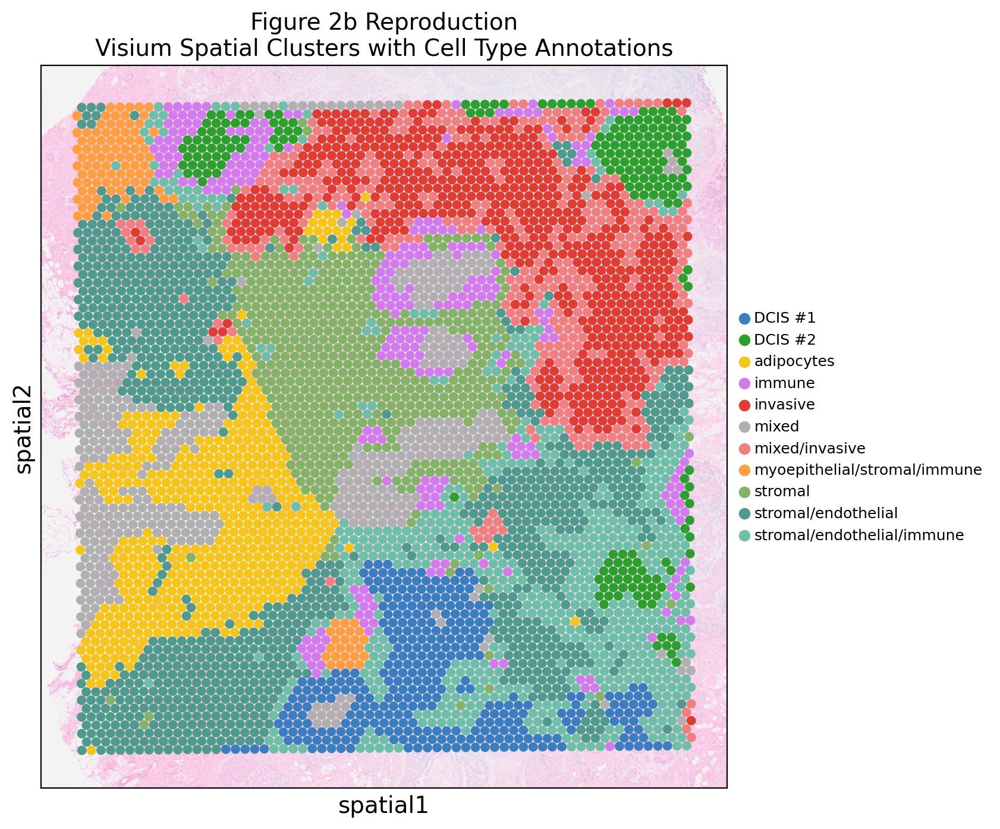

Figure 2b saved to figures/figure2b_spatial_clusters.png


In [49]:
import matplotlib.pyplot as plt
os.makedirs('figures', exist_ok=True)

# Define colours matching the paper's Figure 2b as closely as possible
cell_type_colors = {
    'stromal/endothelial'         : '#4e9a8c',
    'stromal/endothelial/immune'  : '#6dbfa8',
    'adipocytes'                  : '#f5c518',
    'invasive'                    : '#e03c31',
    'mixed/invasive'              : '#f08080',
    'DCIS #1'                     : '#3a7ebf',
    'stromal'                     : '#82b366',
    'immune'                      : '#d17bed',
    'mixed'                       : '#b0b0b0',
    'myoepithelial/stromal/immune': '#ff9f40',
    'DCIS #2'                     : '#2ca02c',
    'unmatched'                   : '#ffffff'
}

# Plot with show=False so we control saving ourselves
sc.pl.spatial(
    adata,
    img_key='hires',
    color='cell_type',
    size=1.4,
    alpha_img=0.6,
    palette=cell_type_colors,
    title='Figure 2b Reproduction\nVisium Spatial Clusters with Cell Type Annotations',
    legend_loc='right margin',
    legend_fontsize=9,
    show=False      # <-- changed to False
)

# Save manually — full control over path
plt.savefig('figures/figure2b_spatial_clusters.png', dpi=150, bbox_inches='tight')
plt.show()
plt.close()
print("Figure 2b saved to figures/figure2b_spatial_clusters.png")

## Step 11 — REPRODUCE FIGURE 2c: Spatial Gene Expression Maps
These are the 8 marker gene plots from Figure 2c. Each shows where a specific gene is expressed across the tissue.

In [50]:
# Exact genes and their biological meaning from Figure 2c of the paper
paper_genes = {
    'SCGB2A2': 'DCIS #1 marker',
    'CPB1'   : 'DCIS #2 marker',
    'KRT17'  : 'Myoepithelial marker',
    'FABP4'  : 'Adipocyte marker',
    'IL2RG'  : 'Immune cell marker',
    'SFRP2'  : 'Stromal marker',
    'CDH2'   : 'Invasive tumor marker',
    'MT-ND1' : 'Mitochondrial / Invasive'
}

# Check which genes are present
genes_found   = [g for g in paper_genes if g in adata.var_names]
genes_missing = [g for g in paper_genes if g not in adata.var_names]

print(f"Genes found   : {genes_found}")
print(f"Genes missing : {genes_missing}")

Genes found   : ['SCGB2A2', 'CPB1', 'KRT17', 'FABP4', 'IL2RG', 'SFRP2', 'CDH2', 'MT-ND1']
Genes missing : []


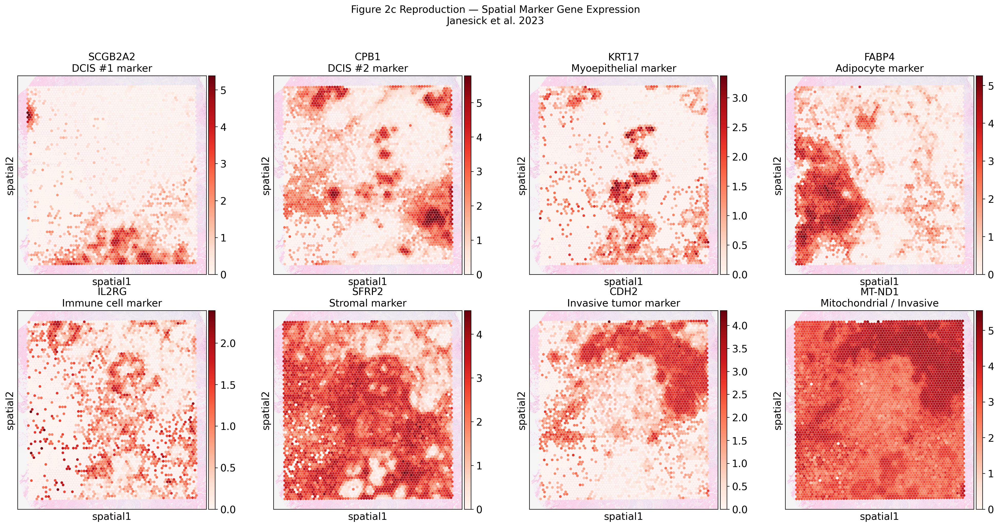

Figure 2c combined panel saved to figures/figure2c_combined_panel.png


In [51]:
# Plot all found genes as one combined panel — matches Figure 2c layout
n_genes = len(genes_found)
n_cols  = 4
n_rows  = int(np.ceil(n_genes / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 5))
axes = axes.flatten()

for idx, gene in enumerate(genes_found):
    sc.pl.spatial(
        adata,
        img_key='hires',
        color=gene,
        size=1.4,
        alpha_img=0.5,
        color_map='Reds',
        title=f'{gene}\n{paper_genes[gene]}',
        ax=axes[idx],
        show=False
    )

# Hide unused subplot panels
for idx in range(n_genes, len(axes)):
    axes[idx].set_visible(False)

plt.suptitle(
    'Figure 2c Reproduction — Spatial Marker Gene Expression\nJanesick et al. 2023',
    fontsize=14, y=1.02
)
plt.tight_layout()
plt.savefig('figures/figure2c_combined_panel.png', dpi=150, bbox_inches='tight')
plt.show()
print("Figure 2c combined panel saved to figures/figure2c_combined_panel.png")

In [52]:
# Also save individual plots per gene
for gene in genes_found:
    sc.pl.spatial(
        adata,
        img_key='hires',
        color=gene,
        size=1.4,
        alpha_img=0.5,
        color_map='Reds',
        title=f'{gene} — {paper_genes[gene]}',
        show=False
    )
    plt.savefig(f'figures/figure2c_{gene}.png', dpi=150, bbox_inches='tight')
    plt.close()
    print(f"Saved: figures/figure2c_{gene}.png")

Saved: figures/figure2c_SCGB2A2.png
Saved: figures/figure2c_CPB1.png
Saved: figures/figure2c_KRT17.png
Saved: figures/figure2c_FABP4.png
Saved: figures/figure2c_IL2RG.png
Saved: figures/figure2c_SFRP2.png
Saved: figures/figure2c_CDH2.png
Saved: figures/figure2c_MT-ND1.png


## Step 12 — Summary Statistics
These should match what the paper reports. Record them in your README.

In [53]:
# Use raw counts for accurate stats
X_raw = adata.layers['counts']

if sp.issparse(X_raw):
    genes_per_spot = (X_raw > 0).sum(axis=1).A1
    counts_per_spot = np.array(X_raw.sum(axis=1)).flatten()
else:
    genes_per_spot  = (X_raw > 0).sum(axis=1)
    counts_per_spot = X_raw.sum(axis=1)

print("=" * 50)
print("SUMMARY STATISTICS — YOUR REPRODUCTION")
print("=" * 50)
print(f"Total spots under tissue   : {adata.n_obs}")
print(f"Total genes after filtering: {adata.n_vars}")
print(f"Median genes per spot      : {int(np.median(genes_per_spot))}")
print(f"Mean reads per spot        : {int(np.mean(counts_per_spot))}")
print(f"Cell types annotated       : {adata.obs['cell_type'].nunique()}")
print()
print("=" * 50)
print("PAPER REPORTS")
print("=" * 50)
print(f"Total spots under tissue   : 4,992")
print(f"Median genes per spot      : 5,712")
print(f"Mean reads per spot        : 40,003")
print(f"Cell type clusters         : 17 (10 unequivocal, 7 mixed)")

SUMMARY STATISTICS — YOUR REPRODUCTION
Total spots under tissue   : 4992
Total genes after filtering: 18049
Median genes per spot      : 5712
Mean reads per spot        : 23096
Cell types annotated       : 11

PAPER REPORTS
Total spots under tissue   : 4,992
Median genes per spot      : 5,712
Mean reads per spot        : 40,003
Cell type clusters         : 17 (10 unequivocal, 7 mixed)


## Step 13 — Save Processed Data to Google Drive

In [54]:
# Restore log-normalized before saving
adata.X = adata.layers['lognorm'].copy()

save_path = os.path.join(BASE_PATH, 'visium_processed_annotated.h5ad')
adata.write_h5ad(save_path)
print(f"Saved processed AnnData to: {save_path}")

# Also download the figures folder as a zip for easy access
import shutil
shutil.make_archive('figures', 'zip', 'figures')

from google.colab import files
files.download('figures.zip')
print("Figures zip downloaded to your computer.")

Saved processed AnnData to: /content/drive/MyDrive/visium_data/visium_processed_annotated.h5ad


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Figures zip downloaded to your computer.


---
## Summary

| Figure | Description | File |
|--------|-------------|------|
| Figure 2b | Spatial cluster map with official annotations | `figure2b_spatial_clusters.png` |
| Figure 2c | 8 marker gene spatial expression maps | `figure2c_combined_panel.png` |
| Figure 2c | Individual gene plots | `figure2c_GENENAME.png` |

## Key Numbers

| Metric | Paper | Result |
|--------|-------|-------------|
| Spots under tissue | 4,992 | See Step 12 |
| Median genes per spot | 5,712 | See Step 12 |
| Mean reads per spot | 40,003 | See Step 12 |
| Cell type annotations | 11 categories | See Step 8 |

---